In [1]:
from editor.utils import set_up_logging

set_up_logging()

import torch
from editor.training import random_edit, HistogramDataset
from editor.visualisation import display_images
from editor.models import load_model
from config import MODELS_PATH, TEST_DATA

device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
model, hyperparameters = load_model(MODELS_PATH / "run_39", device)
dataset = HistogramDataset(
    TEST_DATA,
    edit_count=hyperparameters["edit_count"],
    bin_count=hyperparameters["bin_count"],
    target_size=(640, 640),
)

2024-06-21 21:22:32,580 - INFO - Loading model from /home/andras/projects/bipolaroid/models/run_39
2024-06-21 21:22:32,580 - INFO - Hyperparameters: {'batch_size': 64, 'edit_count': 12, 'bin_count': 16, 'clip_gradients': False, 'learning_rate': 0.0012057557955036278, 'scheduler_gamma': 0.7598365808426665, 'num_epochs': 24, 'model_type': 'Residual', 'loss': 'kl'}
2024-06-21 21:22:33,440 - INFO - Loaded 2498 original images


In [2]:
img = dataset.get_original_image(1008)

edits = {"Original": img}
edits.update({f"Edit {i}": random_edit(img.copy(), seed=i) for i in range(1, 36)})

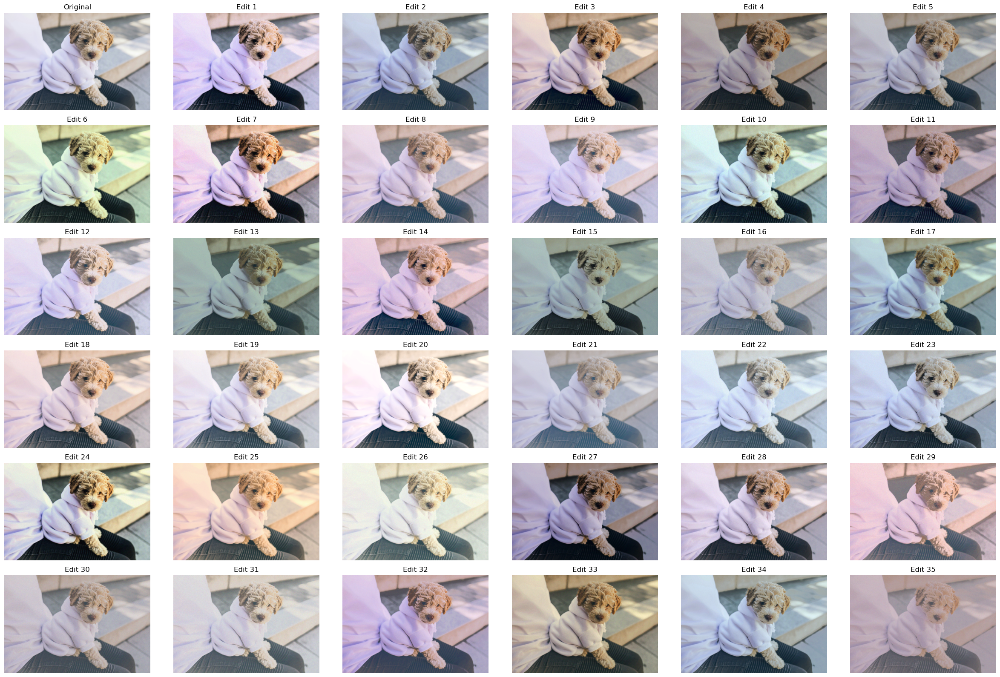

In [3]:
display_images(edits, images_per_row=6, figsize=(24, 16))

In [4]:
import numpy
from editor.utils import compute_histogram


inputs = (
    torch.tensor(
        numpy.array(
            [
                compute_histogram(
                    image, bins=hyperparameters["bin_count"], normalize=True
                )
                for image in edits.values()
            ]
        ),
        dtype=torch.float,
    ).unsqueeze(1)
).to(device)

outputs = model(inputs)

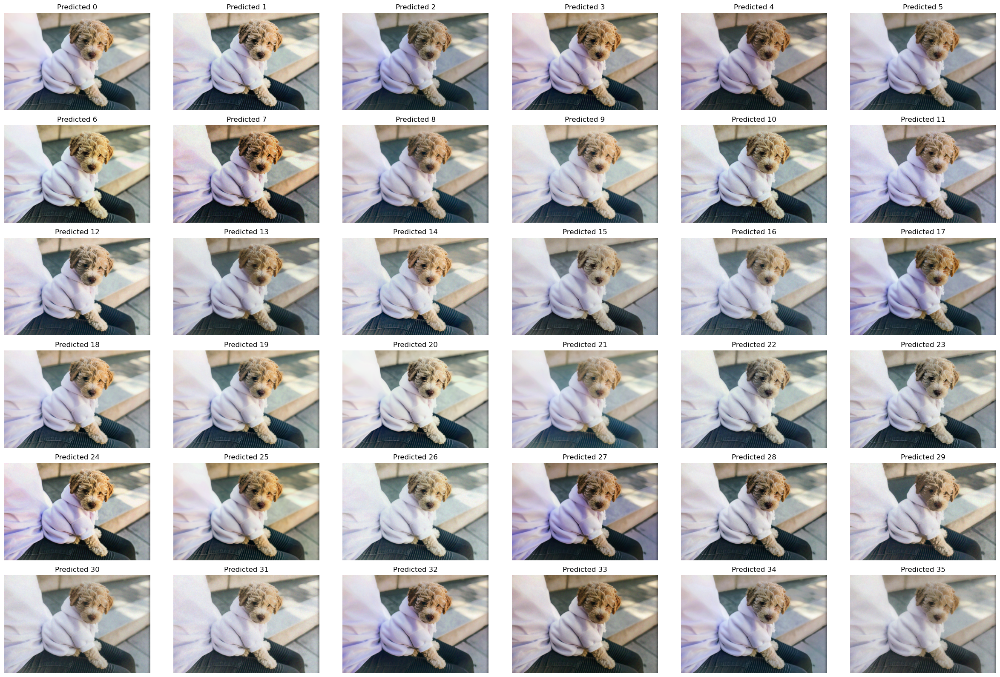

In [5]:
from editor.histogram_transfer import apply_histogram
from PIL import Image


predicted = {
    f"Predicted {i}": Image.fromarray(
        apply_histogram(image, histogram, hyperparameters["bin_count"])
    )
    for i, (image, histogram) in enumerate(zip(edits.values(), outputs))
}
display_images(predicted, images_per_row=6, figsize=(24, 16))